In [52]:
import tkinter as tk
from tkinter import filedialog as fd

import pandas as pd
import numpy as np

import dask.dataframe as dd

import matplotlib.pyplot as plt

from scipy.signal import butter, filtfilt

In [2]:
# Import the data
root = tk.Tk()                     
root.withdraw()
root.attributes("-topmost", True)
root.focus_force()

Well_File_Path = fd.askopenfilename(filetypes=[('Well File', '.csv')])

In [3]:
ddf = dd.read_csv(Well_File_Path)

In [38]:
ddf.head(-5)

c:\Users\Lindsay\anaconda3\Lib\site-packages\dask\dataframe\core.py:8393: UserWarning: Insufficient elements for `head`. -5 elements requested, only 58710 elements available. Try passing larger `npartitions` to `head`.
  warnings.warn(


,Time (s),A1 11,A1 21,A1 31,A1 41,A1 51,A1 61,A1 71,A1 81,A1 12,...,A1 77,A1 87,A1 18,A1 28,A1 38,A1 48,A1 58,A1 68,A1 78,A1 88
0,0.00000,3.290917e-07,-1.316367e-06,-9.872751e-07,9.872751e-07,2.139096e-06,2.577885e-06,-5.484862e-08,4.936376e-07,2.139096e-06,...,2.193945e-07,-1.151821e-06,1.042124e-06,-1.590610e-06,9.872751e-07,-4.387889e-07,9.872751e-07,8.775779e-07,-4.936376e-07,1.426064e-06
1,0.00008,6.033348e-07,-2.193945e-06,-8.775779e-07,8.775779e-07,1.810004e-06,2.413339e-06,4.936376e-07,7.130320e-07,1.755156e-06,...,2.084247e-06,-1.096972e-07,2.139096e-06,-5.484862e-07,3.290917e-07,-5.484862e-07,1.206670e-06,1.700307e-06,-1.096972e-07,-5.484862e-07
2,0.00016,7.678806e-07,-2.413339e-06,0.000000e+00,1.371215e-06,9.324265e-07,1.535761e-06,3.839403e-07,1.371215e-06,2.139096e-06,...,1.919702e-06,3.839403e-07,2.139096e-06,5.484862e-07,-6.033348e-07,-1.426064e-06,9.324265e-07,5.484862e-07,2.742431e-07,-1.480913e-06
3,0.00024,4.936376e-07,-1.151821e-06,1.426064e-06,2.029399e-06,5.484862e-08,8.775779e-07,-2.742431e-07,1.535761e-06,1.700307e-06,...,7.130320e-07,3.290917e-07,9.324265e-07,1.096972e-06,-1.371215e-06,-1.371215e-06,2.742431e-07,-7.678806e-07,0.000000e+00,-2.742431e-07
4,0.00032,5.484862e-08,3.839403e-07,1.755156e-06,2.193945e-06,-9.324265e-07,1.864853e-06,-1.206670e-06,1.206670e-06,1.042124e-06,...,-4.936376e-07,2.193945e-07,-5.484862e-08,1.371215e-06,-1.755156e-06,-4.936376e-07,-2.742431e-07,-6.581834e-07,-9.324265e-07,6.581834e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58705,4.69640,2.193945e-07,1.096972e-07,-1.206670e-06,1.096972e-07,-6.033348e-07,-9.324265e-07,-1.426064e-06,1.535761e-06,4.936376e-07,...,6.033348e-07,-2.742431e-07,-2.193945e-07,5.484862e-08,4.936376e-07,2.084247e-06,-7.678806e-07,-1.042124e-06,4.387889e-07,-8.227293e-07
58706,4.69648,5.484862e-07,0.000000e+00,-9.324265e-07,-8.775779e-07,-7.130320e-07,-6.581834e-07,-1.371215e-06,2.029399e-06,7.130320e-07,...,4.387889e-07,5.484862e-07,4.936376e-07,5.484862e-08,9.872751e-07,3.784555e-06,-1.042124e-06,-1.096972e-06,-3.839403e-07,-6.033348e-07
58707,4.69656,9.324265e-07,6.033348e-07,-5.484862e-08,-1.316367e-06,-1.096972e-06,5.484862e-07,-7.130320e-07,1.316367e-06,8.227293e-07,...,-4.936376e-07,5.484862e-08,1.096972e-06,5.484862e-07,1.261518e-06,4.003949e-06,-1.096972e-06,-2.193945e-07,-1.535761e-06,-1.096972e-06
58708,4.69664,1.096972e-06,1.426064e-06,1.590610e-06,-7.130320e-07,-1.206670e-06,9.872751e-07,2.742431e-07,1.096972e-07,8.775779e-07,...,-1.096972e-06,-1.316367e-06,8.227293e-07,1.480913e-06,4.387889e-07,3.510312e-06,-1.371215e-06,6.581834e-07,-1.864853e-06,-2.029399e-06


In [5]:
import dask.array as da
import matplotlib.pyplot as plt
import dask.dataframe as dd

# Assuming 'ddf' is your Dask DataFrame

# Step 1: Convert the time column to a Dask array
time_array = ddf['Time (s)'].to_dask_array(lengths=True)

# Step 2: Create a Dask array for electrode values (excluding the time column)
electrode_array = ddf.drop('Time (s)', axis=1).to_dask_array(lengths=True)

# Step 3: Create a mapping of column names to indices
column_mapping = {col: idx for idx, col in enumerate(ddf.columns[1:])}

# Print the mappings for verification
print("Column Mapping:", column_mapping)

for i in range(5):  # Example: first 5 time points
    time_value = time_array[i].compute()  # Compute time value
    electrode_values = electrode_array[i, :].compute()  # Compute row values
    print(f"Time: {time_value}, Values: {electrode_values}")


Column Mapping: {'A1 11': 0, 'A1 21': 1, 'A1 31': 2, 'A1 41': 3, 'A1 51': 4, 'A1 61': 5, 'A1 71': 6, 'A1 81': 7, 'A1 12': 8, 'A1 22': 9, 'A1 32': 10, 'A1 42': 11, 'A1 52': 12, 'A1 62': 13, 'A1 72': 14, 'A1 82': 15, 'A1 13': 16, 'A1 23': 17, 'A1 33': 18, 'A1 43': 19, 'A1 53': 20, 'A1 63': 21, 'A1 73': 22, 'A1 83': 23, 'A1 14': 24, 'A1 24': 25, 'A1 34': 26, 'A1 44': 27, 'A1 54': 28, 'A1 64': 29, 'A1 74': 30, 'A1 84': 31, 'A1 15': 32, 'A1 25': 33, 'A1 35': 34, 'A1 45': 35, 'A1 55': 36, 'A1 65': 37, 'A1 75': 38, 'A1 85': 39, 'A1 16': 40, 'A1 26': 41, 'A1 36': 42, 'A1 46': 43, 'A1 56': 44, 'A1 66': 45, 'A1 76': 46, 'A1 86': 47, 'A1 17': 48, 'A1 27': 49, 'A1 37': 50, 'A1 47': 51, 'A1 57': 52, 'A1 67': 53, 'A1 77': 54, 'A1 87': 55, 'A1 18': 56, 'A1 28': 57, 'A1 38': 58, 'A1 48': 59, 'A1 58': 60, 'A1 68': 61, 'A1 78': 62, 'A1 88': 63}
Time: 0.0, Values: [ 3.290917e-07 -1.316367e-06 -9.872751e-07  9.872751e-07  2.139096e-06
  2.577885e-06 -5.484862e-08  4.936376e-07  2.139096e-06  4.387889e-07


#### This is to see each stream one at a time not in a grid

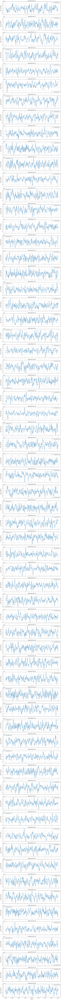

In [6]:
# Step 4: Visualization
def plot_electrodes(start_index=0, end_index=500):  # You can adjust the range as needed
    # Get the time values for the specified range
    time_values = time_array[start_index:end_index].compute()
    
    # Get electrode values for the specified range
    electrode_values = electrode_array[start_index:end_index, :].compute()

    # Create subplots, one for each electrode
    num_electrodes = electrode_values.shape[1]
    fig, axs = plt.subplots(num_electrodes, 1, figsize=(12, num_electrodes * 3), sharex=True)

    # Plot each electrode in its own subplot
    for idx in range(num_electrodes):
        axs[idx].plot(time_values, electrode_values[:, idx], label=f'Electrode {ddf.columns[idx + 1]}')
        axs[idx].set_title(f'Signal from {ddf.columns[idx + 1]}')
        axs[idx].set_ylabel('Signal Amplitude')
        axs[idx].legend()
        axs[idx].grid()

    axs[-1].set_xlabel('Time (s)')  # Set x-label only for the last subplot
    plt.tight_layout()
    plt.show()

# Call the function to plot
plot_electrodes(0, 500)  # Adjust the range as needed

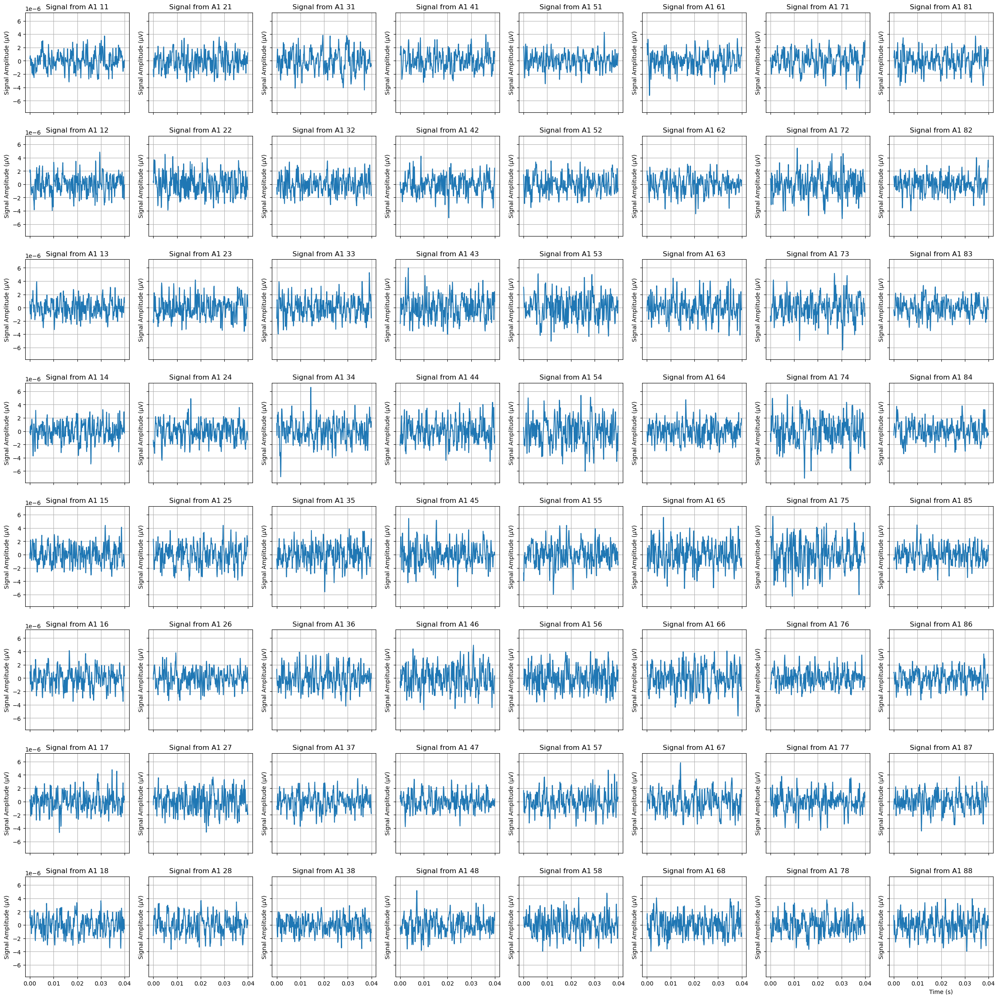

In [25]:
# Step 4: Visualization function
def plot_electrodes(start_index=0, end_index=500, single_electrode=None):  
    # Get the time values for the specified range
    time_values = time_array[start_index:end_index].compute()
    
    # Get electrode values for the specified range
    electrode_values = electrode_array[start_index:end_index, :].compute()

    # Determine number of electrodes
    num_electrodes = electrode_values.shape[1]
    
    # Create a grid layout for the electrodes
    ncols = 8  # Number of columns in the grid
    nrows = (num_electrodes + ncols - 1) // ncols  # Calculate rows needed

    # Create subplots for each electrode
    fig, axs = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows), sharex=True, sharey=True)
    
    # Flatten the axes array for easy iteration if needed
    axs = axs.flatten()

    # Plot each electrode in its subplot
    for idx in range(num_electrodes):
        if single_electrode is not None and idx != single_electrode:
            axs[idx].axis('off')  # Hide axes for non-selected electrodes
            continue
        
        axs[plot_idx[0] * ncols + plot_idx[1]].plot(time_values, electrode_values[:, idx], label=f'Electrode {ddf.columns[idx + 1]}')
        axs[plot_idx[0] * ncols + plot_idx[1]].set_title(f'Signal from {ddf.columns[idx + 1]}')
        axs[plot_idx[0] * ncols + plot_idx[1]].set_ylabel('Signal Amplitude (µV)')
        axs[plot_idx[0] * ncols + plot_idx[1]].grid()
    
    # If single electrode is not specified, hide remaining subplots
    for idx in range(num_electrodes, nrows * ncols):
        axs[idx].axis('off')

    axs[-1].set_xlabel('Time (s)')  # Set x-label only for the last subplot
    plt.tight_layout()
    plt.show()

# Call the function to plot
plot_electrodes(0, 500)  # Adjust the range as needed


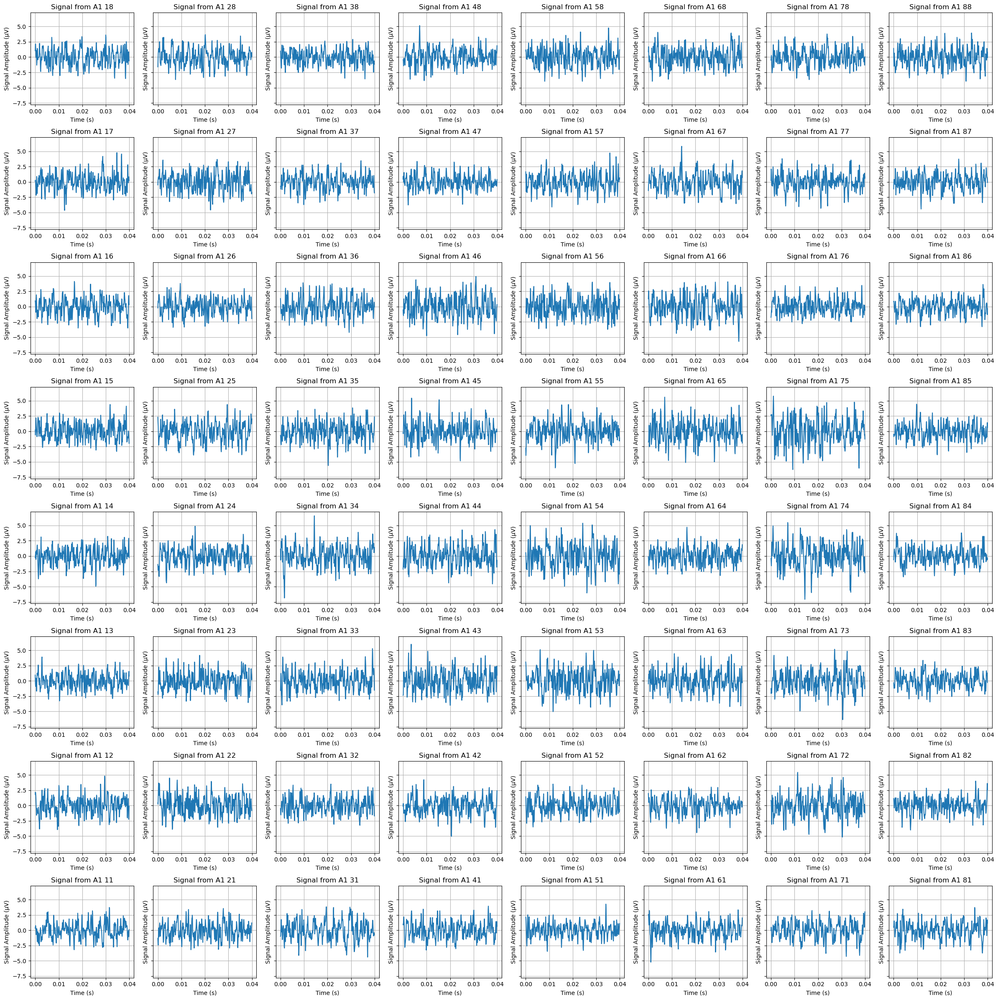

In [50]:
import matplotlib.pyplot as plt

start_index = 0
end_index = 500

# Step 4: Visualization function
def plot_electrodes(start_index = start_index, end_index = end_index, single_electrode=None): 

    # Get the time values for the specified range
    time_values = time_array[start_index:end_index].compute()
    
    # Get electrode values for the specified range
    electrode_values = electrode_array[start_index:end_index, :].compute()

    # Convert electrode values from volts to microvolts (µV)
    electrode_values *= 1e6  # Conversion factor from V to µV

    # Determine number of electrodes
    num_electrodes = electrode_values.shape[1]
    
    # Create a grid layout for the electrodes
    ncols = 8  # Number of columns in the grid
    nrows = (num_electrodes + ncols - 1) // ncols  # Calculate rows needed

    # Create subplots for each electrode
    fig, axs = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows), sharex=False, sharey=True)
    
    # Flatten the axes array for easy iteration
    axs = axs.flatten()

    # Plot each electrode in its subplot, reversing the order for Axion's indexing
    for idx in range(num_electrodes):
        # Calculate the index to start from the bottom left
        plot_idx = (nrows - 1 - (idx // ncols), idx % ncols)  # (row, col)
        
        if single_electrode is not None and idx != single_electrode:
            axs[plot_idx[0] * ncols + plot_idx[1]].axis('off')  # Hide axes for non-selected electrodes
            continue
        
        axs[plot_idx[0] * ncols + plot_idx[1]].plot(time_values, electrode_values[:, idx], label=f'Electrode {ddf.columns[idx + 1]}')
        axs[plot_idx[0] * ncols + plot_idx[1]].set_title(f'Signal from {ddf.columns[idx + 1]}')
        axs[plot_idx[0] * ncols + plot_idx[1]].set_xlabel('Time (s)')
        axs[plot_idx[0] * ncols + plot_idx[1]].set_ylabel('Signal Amplitude (µV)')
        axs[plot_idx[0] * ncols + plot_idx[1]].grid()

    plt.tight_layout()
    plt.show()

# Call the function to plot
plot_electrodes(start_index, end_index)  # Adjust the range as needed


In [63]:
import dask.array as da
import dask.dataframe as dd
import numpy as np
from scipy.signal import butter, filtfilt

# Parameters for filtering
fs = 12500  # Sampling frequency (12.5 kHz)
lowcut = 0.1  # Low cut frequency
highcut = 5000  # High cut frequency
threshold_factor = 5.5  # Spike detection threshold factor

# Function to apply band-pass filter
def bandpass_filter(data, lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data)

# Function to detect spikes using adaptive threshold
def detect_spikes(filtered_data):
    noise_std = np.std(filtered_data)
    threshold = threshold_factor * noise_std
    spike_indices = np.where(filtered_data > threshold)[0]
    return spike_indices.tolist()  # Return as a list


# Initialize lists to hold filtered data and spike indices
filtered_electrode_arrays = []
spike_indices_list = []

# Process each electrode
for i in range(electrode_array.shape[1]):  # Loop over electrodes
    electrode_values = electrode_array[:, i].compute()  # Compute values for the current electrode
    filtered_data = bandpass_filter(electrode_values, lowcut, highcut, fs)  # Filter the data
    spikes = detect_spikes(filtered_data)  # Detect spikes

    # Check if there are any spikes detected
    if spikes:  # Only proceed if spikes list is not empty
        # Store results
        filtered_electrode_arrays.append(filtered_data)
        spike_indices_list.append(spikes)

        # Optionally: Print the first few spikes for the current electrode
        print(f"Electrode {ddf.columns[i + 1]} Spikes:", spikes[:5])  # Print first 5 spike indices
    else:
        print(f"Electrode {ddf.columns[i + 1]} has no spikes detected.")  # Indicate no spikes detected


Electrode A1 11 has no spikes detected.
Electrode A1 21 has no spikes detected.


KeyboardInterrupt: 

In [64]:
import dask.array as da
import dask.dataframe as dd
import numpy as np
from scipy.signal import butter, filtfilt
from dask import delayed, compute

# Parameters for filtering
fs = 12500  # Sampling frequency (12.5 kHz)
lowcut = 0.1  # Low cut frequency
highcut = 5000  # High cut frequency
threshold_factor = 5.5  # Spike detection threshold factor

# Function to apply band-pass filter and detect spikes
@delayed
def process_electrode(electrode_values):
    # Band-pass filter
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(5, [low, high], btype='band')
    filtered_data = filtfilt(b, a, electrode_values)

    # Spike detection
    noise_std = np.std(filtered_data)
    threshold = threshold_factor * noise_std
    spike_indices = np.where(filtered_data > threshold)[0]

    return filtered_data, spike_indices.tolist()  # Return filtered data and spike indices

# Create a list of delayed function calls for each electrode
results = [process_electrode(electrode_array[:, i]) for i in range(electrode_array.shape[1])]

# Compute results in parallel
computed_results = compute(*results)

# Initialize lists to hold filtered data and spike indices
filtered_electrode_arrays = []
spike_indices_list = []

# Collect results
for i, (filtered_data, spikes) in enumerate(computed_results):
    # Check if there are any spikes detected
    if spikes:  # Only proceed if spikes list is not empty
        filtered_electrode_arrays.append(filtered_data)
        spike_indices_list.append(spikes)

        # Optionally: Print the first few spikes for the current electrode
        print(f"Electrode {ddf.columns[i + 1]} Spikes:", spikes[:5])  # Print first 5 spike indices
    else:
        print(f"Electrode {ddf.columns[i + 1]} has no spikes detected.")  # Indicate no spikes detected


KeyboardInterrupt: 